# Multimodal LLMs

Certain LLMs such as `GPT-4o` and `Gemini 1.5 Flash` are multimodal LLMs, which means they accept images as well as text as input. (Some support audio and video as well.) The ability for LLMs to consume images opens up a world of possibilities for software developers. Let's look at a few examples.

## GPT-4o

OpenAI's flagship `GPT-4o` model accepts text and images as input. Let's take it for a spin and test out its multimodal capabilities. Start by loading a photo of a cute Corgi:

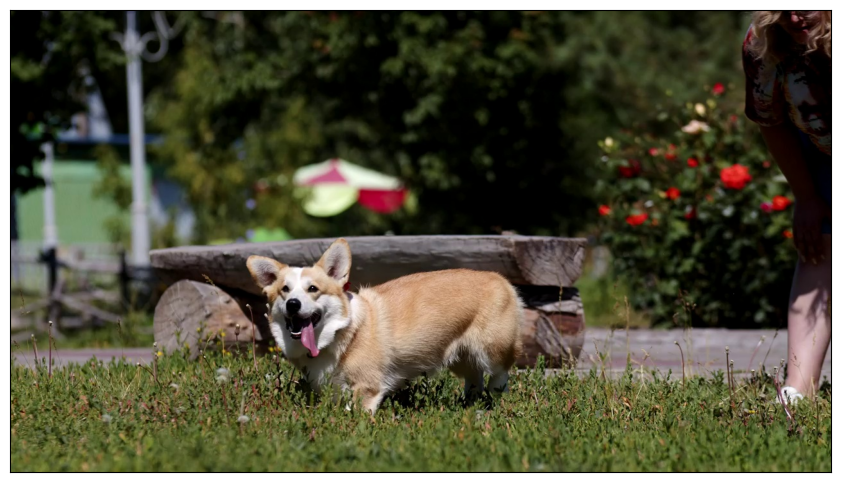

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open('Data/corgi.png')
fig, ax = plt.subplots(1, figsize=(12, 6))
ax.set_xticks([])
ax.set_yticks([])
ax.imshow(image)

`GPT-4o` currently requires images to be passed using data URLs, so define a function that generates a data URL from an image:

In [2]:
import base64
from io import BytesIO

def get_data_url(image):
    io = BytesIO()
    image.save(io, format='PNG')
    bytes = base64.b64encode(io.getvalue()).decode('utf-8')
    return f'data:image/png;base64,{bytes}'

Now use `GPT-4o` to analyze the image:

In [ ]:
from openai import OpenAI

client = OpenAI(api_key='OPENAI_API_KEY')

messages = [
    {
        'role': 'user',
        'content': [
            { 'type': 'text', 'text': 'Describe what you see in this image' },
            { 'type': 'image_url', 'image_url': { 'url': get_data_url(image) }}
        ]
    }
]

response = client.chat.completions.create(
    model='gpt-4o',
    messages=messages,
    stream=True
)

for chunk in response:
    content = chunk.choices[0].delta.content
    if content is not None:
        print(content, end='')

In the image, there is a corgi standing in a grassy area with its tongue out, looking happy. Behind the dog is a wooden bench and some greenery. In the background, there are colorful flowers and an out-of-focus umbrella. A person is partially visible to the right of the image.

Next, use `GPT-4o` to summarize the contents of a video. Begin by defining a function that takes a path to a video file as input and returns a list of frames from the video. This sample requires the Python package [opencv-python](https://pypi.org/project/opencv-python/). If it's not installed, now's a good time to install it.

In [4]:
import cv2

def process_video(path, seconds_per_frame=1):
    frames = []

    video = cv2.VideoCapture(path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video.get(cv2.CAP_PROP_FPS)
    frames_to_skip = int(fps * seconds_per_frame)

    # Loop through the video and extract frames at the specified sampling rate
    for i in range(total_frames):
        video.set(cv2.CAP_PROP_POS_FRAMES, i * frames_to_skip)
        success, frame = video.read()

        if not success:
            break

        _, buffer = cv2.imencode('.jpg', frame)
        bytes = base64.b64encode(buffer).decode('utf-8')
        data_url = f'data:image/jpeg;base64,{bytes}'
        frames.append(data_url)

    video.release()
    print(f'Extracted {len(frames)} frames')
    return frames

Use the `process_video` function to extract frames from a video. The video was downloaded from [Mixkit](https://mixkit.co/), an online content service that makes a variety of videos available for free.

In [5]:
frames = process_video('Data/corgi.mp4')

Extracted 6 frames


Pass the frames to `GPT-4o` and ask it to summarize them:

In [6]:
from openai import OpenAI

response = client.chat.completions.create(
    model='gpt-4o',
    messages = [{
        'role': 'user',
        'content': [
            { 'type': 'text', 'text': 'Generate a brief video summary from the following frames extracted from the video' },
            *map(lambda url: { 'type': 'image_url', 'image_url': { 'url': url }}, frames)
        ],
    }],
    stream=True
)

for chunk in response:
    content = chunk.choices[0].delta.content
    if content is not None:
        print(content, end='')

The video captures a joyful corgi in a vibrant park setting. Initially, the corgi stands joyfully on the grass, showing excitement and energy. As the frames progress, the corgi playfully runs towards the camera with a ball in its path, highlighting its lively nature and the fun atmosphere. The lush greenery and bright background emphasize a cheerful and carefree day outdoors.

Load a map of Zork's Underground Empire:

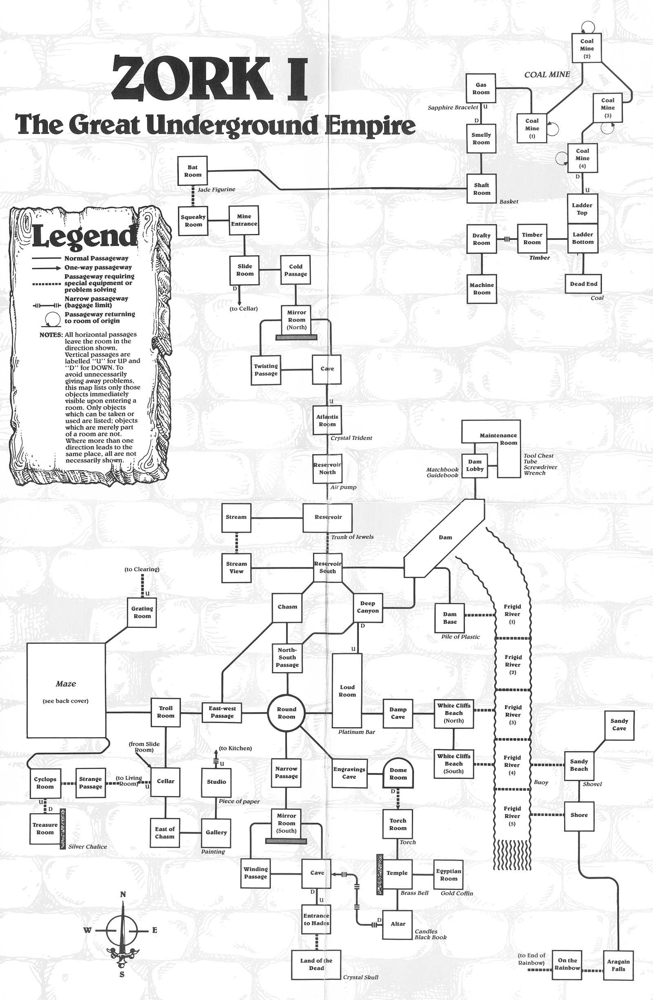

In [7]:
image = Image.open('Data/zork.jpg')
display(image)

Now parse the map and build a JSON representation of its contents:

In [8]:
prompt = '''
    This image comes from a legendary text-based adventure game named Zork. It contains
    a map of the locations that make up Zork's Underground Empire. Users move from location
    to location by entering commands such as "go north" and "go west." Generate a JSON array
    from all the locations depicted in the map and represent individual locations using the
    following format:

    [
        {
            "name": "Kitchen",
            "exits": { "west": "Living Room", "up": "Attic", "down": "Cellar" },
            "items": ["Lantern", "Brown Sack", "Glass Bottle"]
        }
    ]
    '''

messages = [
    {
        'role': 'user',
        'content': [
            { 'type': 'text', 'text': prompt },
            { 'type': 'image_url', 'image_url': { 'url': get_data_url(image) }}
        ]
    }
]

response = client.chat.completions.create(
    model='gpt-4o',
    messages=messages,
    response_format={ 'type': 'json_object' },
    stream=True
)

for chunk in response:
    content = chunk.choices[0].delta.content
    if content is not None:
        print(content, end='')


{
    "locations": [
        {
            "name": "Bat Room",
            "exits": {"south": "Squeaky Room"},
            "items": ["Jade Figurine"]
        },
        {
            "name": "Squeaky Room",
            "exits": {"north": "Bat Room", "south": "Mine Entrance"},
            "items": []
        },
        {
            "name": "Mine Entrance",
            "exits": {"north": "Squeaky Room", "east": "Slide Room", "west": "Cold Passage"},
            "items": []
        },
        {
            "name": "Slide Room",
            "exits": {"west": "Mine Entrance"},
            "items": []
        },
        {
            "name": "Cold Passage",
            "exits": {"east": "Mine Entrance", "north": "Shaft Room"},
            "items": []
        },
        {
            "name": "Shaft Room",
            "exits": {"south": "Cold Passage", "north": "Smelly Room"},
            "items": ["Basket"]
        },
        {
            "name": "Smelly Room",
            "exits": {"south

Another task at which `GPT-4o` excels is identifying locations from photos. Here's a photo taken last year in Morocco:

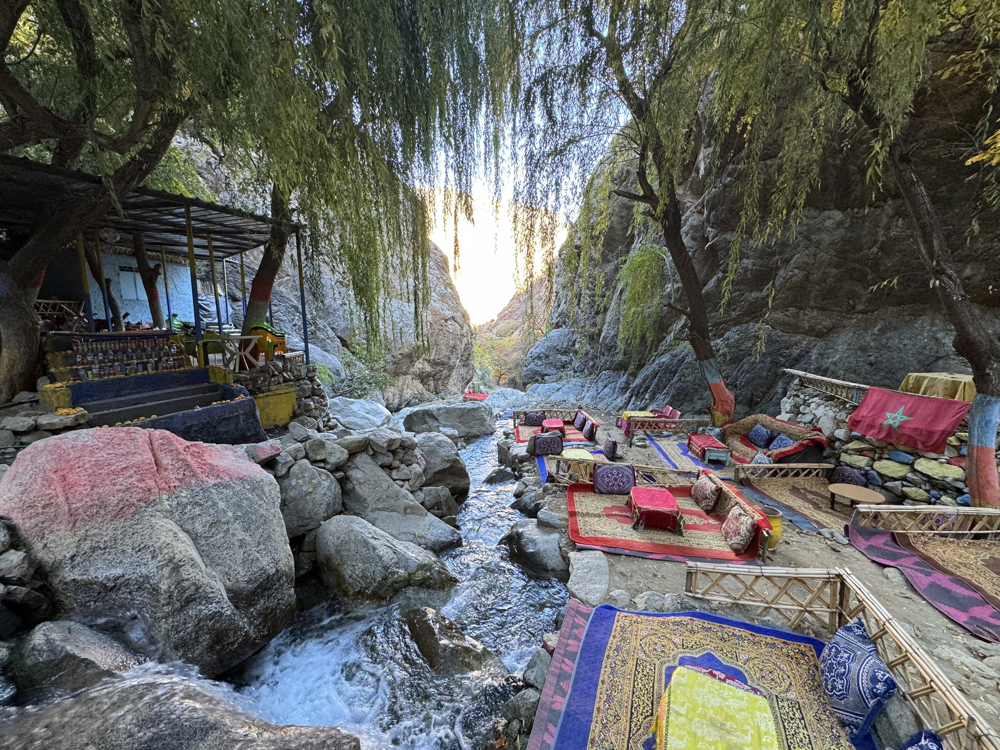

In [9]:
image = Image.open('Data/morocco.jpg')
display(image)

Let's see if `GPT-4o` can identify where the photo was taken:

In [10]:
messages = [
    {
        'role': 'user',
        'content': [
            { 'type': 'text', 'text': 'Where was this photo taken?' },
            { 'type': 'image_url', 'image_url': { 'url': get_data_url(image) }}
        ]
    }
]

response = client.chat.completions.create(
    model='gpt-4o',
    messages=messages,
    stream=True
)

for chunk in response:
    content = chunk.choices[0].delta.content
    if content is not None:
        print(content, end='')

This photo was taken in the Ourika Valley, located in the Atlas Mountains near Marrakech, Morocco. The setting is a popular spot with traditional seating by the river.

## Gemini 1.5 Flash

Google's `Gemini 1.5 Flash` is also an excellent multimodal LLM. It accepts text, images, video, and audio as input. Let's use it to analyze the same Corgi image that `GPT-4o` analyzed above. Start by loading the image:

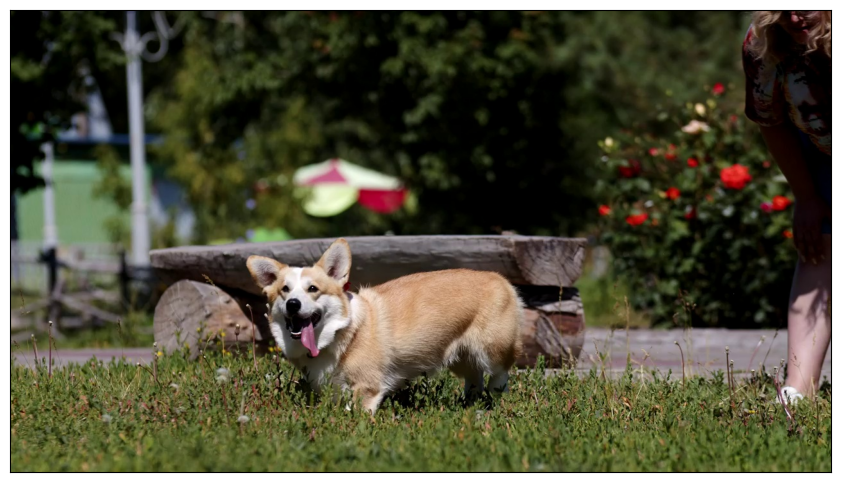

In [11]:
image = Image.open('Data/corgi.png')
fig, ax = plt.subplots(1, figsize=(12, 6))
ax.set_xticks([])
ax.set_yticks([])
ax.imshow(image)

Ask Gemini to describe it:

In [ ]:
import google.generativeai as genai

genai.configure(api_key='GOOGLE_API_KEY')
model = genai.GenerativeModel('gemini-1.5-flash')

response = model.generate_content([image, 'Describe this image'], stream=True)

for chunk in response:
    print(chunk.text, end='')

A small, white and brown dog, potentially a corgi, is standing in the grass and looking off to the side. Behind it, a wooden bench is on the ground and a woman with blonde hair is standing behind the bench.  The background is blurred with trees and a variety of plants.

Flash was trained to do object detection, too. Use it to generate bounding boxes for each dog in the photo:

In [13]:
prompt = '''
    Return a bounding box for each dog in this image using the following JSON format:
    {
        "xmin": xmin,
        "ymin": ymin,
        "xmax": xmax,
        "ymax": ymax
    }
    return an array of objects, even if the the array contains just one element. Do not return markdown. Return JSON only.
    '''

response = model.generate_content([image, prompt])
print(response.text)

[
  {
    "xmin": 296,
    "ymin": 494,
    "xmax": 622,
    "ymax": 890
  }
]


Draw the bounding box onto the image:

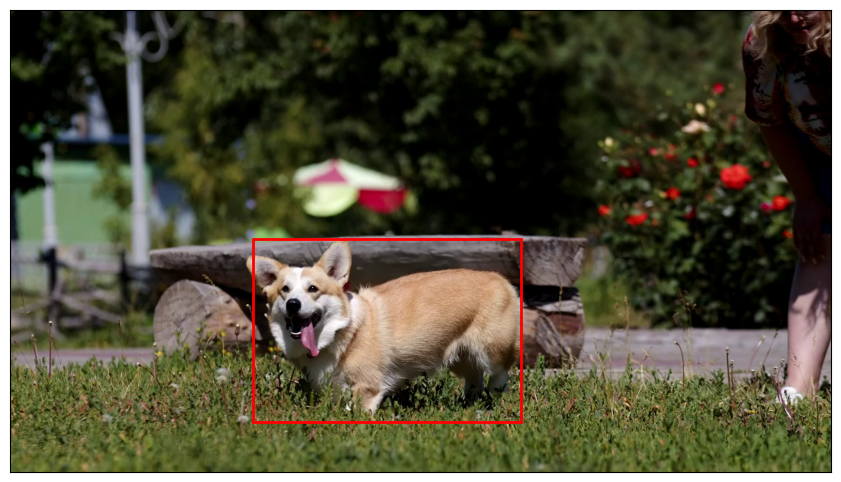

In [14]:
import json
import matplotlib.patches as patches

boxes = json.loads(response.text)
image_width, image_height = image.size

fig, ax = plt.subplots(1, figsize=(12, 6))
ax.set_xticks([])
ax.set_yticks([])
ax.imshow(image)

for box in boxes:
    xmin = (box['xmin'] / 1000) * image_width
    ymin = (box['ymin'] / 1000) * image_height
    xmax = (box['xmax'] / 1000) * image_width
    ymax = (box['ymax'] / 1000) * image_height
    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

Flash can analyze video, too. You don't even have to extract frames from the video:

In [15]:
import time

# Upload the video
print('Uploading video')
video = genai.upload_file(path='Data/corgi.mp4')

# Wait until video processing is complete
while video.state.name == 'PROCESSING':
    time.sleep(1)
    video = genai.get_file(video.name)

if video.state.name == 'FAILED':
    print('Video processing failed')
else:
    print('Processing complete')

Uploading video
Processing complete


Summarize the video.

In [16]:
response = model.generate_content([video, 'Generate a brief summary of this video'], stream=True)

for chunk in response:
    print(chunk.text, end='')

A corgi runs toward the camera with its tongue out. It's running on green grass and looks happy.  

Load a photo depicting a confusing array of parking signs:

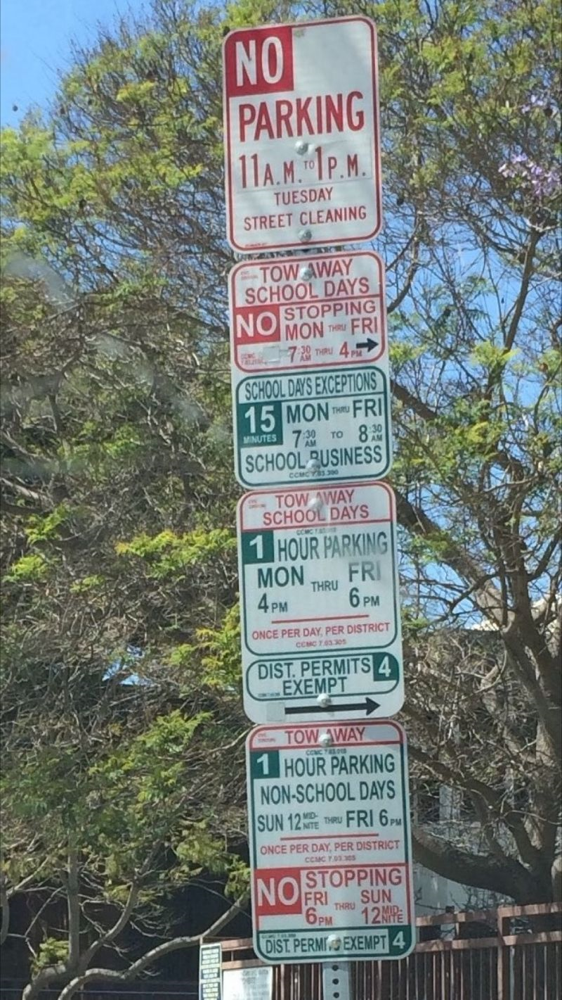

In [17]:
image = Image.open('Data/signs.png')
display(image)

Can Flash make sense of all those signs and help you decide whether it's OK to park?

In [19]:
prompt = """
    It's 5:00 p.m. on Thursday. Am I allowed to park here for 30 minutes to drop off a package?
    Think it through step by step, and explain your reasoning. Assume that it's OK to park unless
    the rules explicitly state otherwise. Consider all the signs in making a determination, and
    do not return markdown in your response.
    """

response = model.generate_content([image, prompt], stream=True)

for chunk in response:
    print(chunk.text, end='')

Yes, you are allowed to park for 30 minutes to drop off a package. 

Here's why: 

First, the top sign prohibits parking from 11 a.m. to 1 p.m. on Tuesdays. It's Thursday and 5:00 p.m., so that restriction does not apply. 

The next sign prohibits stopping or parking for 15 minutes between 7:30 a.m. and 8:30 a.m. on school days.  It is not a school day, so this rule does not apply. 

The next sign prohibits parking for longer than one hour between 4:00 p.m. and 6:00 p.m. on Mondays, but it is Thursday, so that rule does not apply. 

The fourth sign does restrict parking to one hour per day per district, but that is only in effect between 4:00 p.m. and 6:00 p.m. on Mondays, Tuesdays, Wednesdays, Thursdays, and Fridays. It's Thursday, but it's 5:00 p.m., so the restriction does not apply. 

The fifth sign restricts parking to one hour between 12:00 midnight and 6:00 p.m. on Sundays, and between 6:00 p.m. and 12:00 midnight on Fridays. This sign does not apply because it's Thursday, not S